##Anas Baig 002837748

## All the Earthquakes- Analysis and Prediction Using Decsion Tree, Regression, XGboost and Random Forest




In [1]:
#Loading all dependencies
!pip install ydata_profiling
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import pandas as pd
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 15.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=d8bdde671d3f81023f513b53b5b4f30b51602d3f8bdf74586b7c00f510689d16
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [2]:
#Loading our dataset
df =pd.read_csv("/content/sample_data/Eartquakes-1990-2023.csv")

# Load tectonic plate boundary data using geopandas

plate_boundaries_gdf = gpd.read_file('/content/sample_data/PB2002_boundaries.shp')

# Load world countries boundary data using geopandas
world_countries_gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


<ipython-input-2-040e214a5de3>:9: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



#Description of Dataset
1.	Time: The timestamp of the earthquake event in milliseconds.
2.	Place: Geographical location where the earthquake occurred.
3.	Status: Represents the current state or condition of the event.
4.	Tsunami: Boolean value indicating the presence of associated ocean waves.
5.	Significance: Denotes the importance or impact level of the earthquake event.
6.	Data_Type: Specifies the type of referenced data.
7.	Magnitude: Measurement of the earthquake's size or intensity.
8.	State: Represents the administrative division or state where the event occurred.
9.	Longitude: Coordinates of the earthquake's location.
10.	Latitude: Coordinates the earthquake's location.
11.	Depth: The depth of the earthquake's epicenter.
12.	Date: Date when the earthquake occurred.

In [3]:
df.head()

,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
0,631153353990,"12 km NNW of Meadow Lakes, Alaska",reviewed,0,96,earthquake,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00
1,631153491210,"14 km S of Volcano, Hawaii",reviewed,0,31,earthquake,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00
2,631154083450,"7 km W of Cobb, California",reviewed,0,19,earthquake,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00
3,631155512130,"11 km E of Mammoth Lakes, California",reviewed,0,15,earthquake,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00
4,631155824490,"16km N of Fillmore, CA",reviewed,0,134,earthquake,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00


### Checking all Features and Their DataType

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216953 entries, 0 to 216952
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          216953 non-null  int64  
 1   place         216953 non-null  object 
 2   status        216953 non-null  object 
 3   tsunami       216953 non-null  int64  
 4   significance  216953 non-null  int64  
 5   data_type     216953 non-null  object 
 6   magnitudo     216953 non-null  float64
 7   state         216953 non-null  object 
 8   longitude     216952 non-null  float64
 9   latitude      216952 non-null  float64
 10  depth         216952 non-null  float64
 11  date          216952 non-null  object 
dtypes: float64(4), int64(3), object(5)
memory usage: 19.9+ MB


### Checking for null Values

In [5]:
df.isnull().sum()

time            0
place           0
status          0
tsunami         0
significance    0
data_type       0
magnitudo       0
state           0
longitude       1
latitude        1
depth           1
date            1
dtype: int64

### Converting 'date' from object to Datetime dtype

In [6]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216953 entries, 0 to 216952
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   time          216953 non-null  int64              
 1   place         216953 non-null  object             
 2   status        216953 non-null  object             
 3   tsunami       216953 non-null  int64              
 4   significance  216953 non-null  int64              
 5   data_type     216953 non-null  object             
 6   magnitudo     216953 non-null  float64            
 7   state         216953 non-null  object             
 8   longitude     216952 non-null  float64            
 9   latitude      216952 non-null  float64            
 10  depth         216952 non-null  float64            
 11  date          214746 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), float64(4), int64(3), object(4)
memory usage: 19.9+ MB


### Checking for unique values in each column

In [8]:
df.nunique()

time            215637
place            67647
status               2
tsunami              1
significance       374
data_type            9
magnitudo          552
state              516
longitude        80256
latitude         69656
depth            24557
date            213443
dtype: int64

### Checking for most occurences in State Column

In [9]:
state_counts = df['state'].value_counts()
print(state_counts.head(20))

state
 California          116584
California            20560
 Alaska               15879
 Hawaii                8031
 Washington            6755
 Utah                  3404
 Greece                3353
 Turkey                2369
 Indonesia             2199
 Italy                 1981
 France                1915
 B.C.                  1876
 Chile                 1613
 Japan                 1273
 Philippines           1254
 Papua New Guinea      1235
 Russia                 958
 Montana                880
 Montenegro             625
 Colombia               584
Name: count, dtype: int64


## Data Preprocessing & EDA

In [10]:
# Finding duplicate rows
duplicate_rows = df[df.duplicated(keep='first')]

# Number of duplicate rows
num_duplicates = duplicate_rows.shape[0]

# Displaying the duplicate rows
print(f"Number of duplicate rows: {num_duplicates}")
duplicate_rows

Number of duplicate rows: 1309


,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
9214,636249654650,"3 km E of Mammoth Lakes, California",reviewed,0,42,earthquake,1.66,California,-118.933667,37.6470,3.816,1990-03-01 00:00:54.650000+00:00
9216,636249667890,"4km N of Claremont, CA",reviewed,0,70,earthquake,2.13,California,-117.717000,34.1330,4.275,1990-03-01 00:01:07.890000+00:00
9218,636249694400,"4km N of Claremont, CA",reviewed,0,62,earthquake,2.00,California,-117.717000,34.1330,4.275,1990-03-01 00:01:34.400000+00:00
9220,636249712400,"5km NNE of Claremont, CA",reviewed,0,22,earthquake,1.20,California,-117.705000,34.1440,5.702,1990-03-01 00:01:52.400000+00:00
9222,636249724170,"4km N of Claremont, CA",reviewed,0,160,earthquake,3.22,California,-117.714000,34.1300,5.622,1990-03-01 00:02:04.170000+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
205762,731116034430,"6 km ESE of Fritz Creek, Alaska",reviewed,0,74,earthquake,2.20,Alaska,-151.185500,59.7085,17.400,1993-03-02 23:47:14.430000+00:00
205764,731116129210,"4 km SSW of Asson, France",reviewed,0,138,earthquake,3.00,France,-0.275000,43.1000,10.000,1993-03-02 23:48:49.210000+00:00
205766,731116272300,"29km N of Yucca Valley, California",reviewed,0,16,earthquake,1.02,California,-116.459000,34.3760,3.378,1993-03-02 23:51:12.300000+00:00
205768,731116336450,"5 km SSW of Carletonville, South Africa",reviewed,0,104,earthquake,2.60,South Africa,27.385000,-26.4080,5.000,1993-03-02 23:52:16.450000+00:00


In [11]:
# Drop duplicates rows
df.drop_duplicates(keep='first', inplace=True)

### We will Extract following Features from the Date column

In [12]:
def transform_date(df):
    df = df.copy()
    df["hour"] = df.date.dt.hour
    df["day_of_month"] = df.date.dt.day
    df["weekday"] = df.date.dt.day_name()
    df["month"] = df.date.dt.month
    df["month_name"] = df.date.dt.month_name()
    df["year"] =df.date.dt.year
    return df
df = transform_date(df)

### From the below graph we can infer that magnitude of earthquake has been increasing overtime, There might be multiple reason like Urbanization, Climate change however we also have to consider the improvement in the technology to record earthquake data.

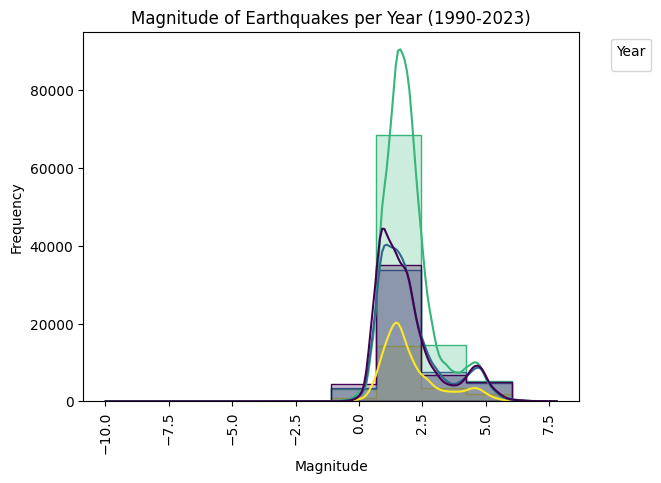

In [13]:
# Extract the year
year = df.year

# Extract the magnitude
magnitude = df.magnitudo

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'year' and 'magnitudo' are the correct column names in your DataFrame
# Plot a histogram of the magnitudes, with different colors for different years
sns.histplot(data=df, x='magnitudo', hue='year', bins=10, kde=True, element='step', palette='viridis')
plt.xlabel("Magnitude")
plt.ylabel("Frequency")
plt.title("Magnitude of Earthquakes per Year (1990-2023)")
plt.xticks(rotation=90)
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### This Graph shows the distribution of magnitude values and we can see that most common earthquakes have values ranging from 0 to 5 magnitude.

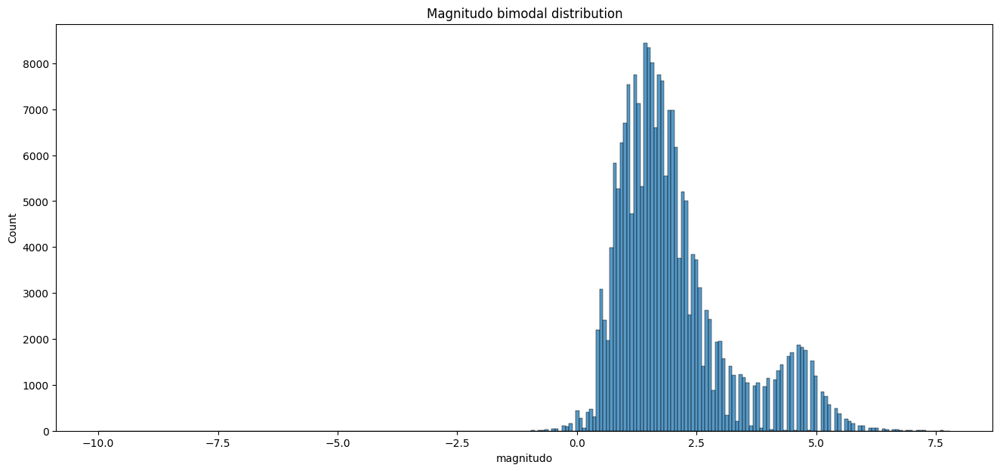

In [14]:
plt.figure(figsize = (16,7))
sns.histplot(df["magnitudo"], bins = 250)
plt.title("Magnitudo bimodal distribution")
plt.show()

### Cleaning the status column and merging the repeated values

In [15]:
df['status'].unique()

array(['reviewed', 'automatic'], dtype=object)

In [16]:
import re

status_mapping = {'reviewed': 'Reviewed', 'automatic': 'Automatic', 'manual': 'Manual'}

# Use regular expressions with the re.IGNORECASE flag to replace values
for pattern, replacement in status_mapping.items():
    df['status'] = df['status'].replace(re.compile(pattern, re.IGNORECASE), replacement)

# Verify the updated value counts
print(df['status'].value_counts())

status
Reviewed     215558
Automatic        86
Name: count, dtype: int64


### Here we check the unique values of data_type column

In [17]:
df['data_type'].value_counts()


data_type
earthquake            209488
quarry blast            4373
explosion               1631
chemical explosion        50
other event               38
nuclear explosion         34
ice quake                 19
rock burst                10
sonic boom                 1
Name: count, dtype: int64

### We plot to see if there are enough miscellenous values in data_type that might make a considerable impact in the model predicition

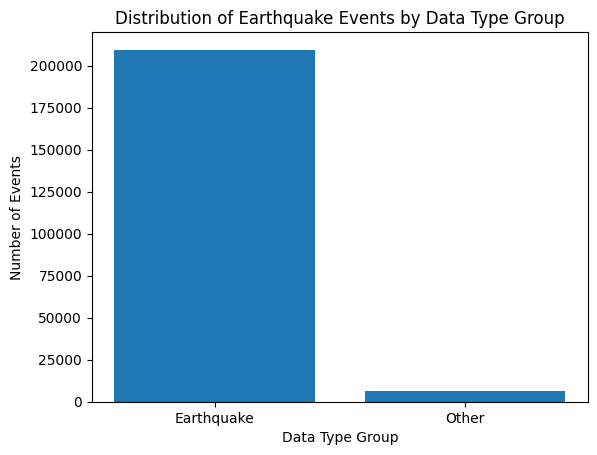

In [18]:
# Create a new column called 'data_type_group'
df['data_type_group'] = df['data_type'].apply(lambda x: 'Earthquake' if x == 'earthquake' else 'Other')

# Group the values in the 'data_type_group' column and count the number of events in each group
data_type_counts = df['data_type_group'].value_counts()

# Create a new plot to visualize the number of events in each group
plt.figure()
plt.bar(data_type_counts.index, data_type_counts.values)
plt.xlabel('Data Type Group')
plt.ylabel('Number of Events')
plt.title('Distribution of Earthquake Events by Data Type Group')
plt.show()

### We plot a box plot distribution by year to get a better idea of the magnitude distribution

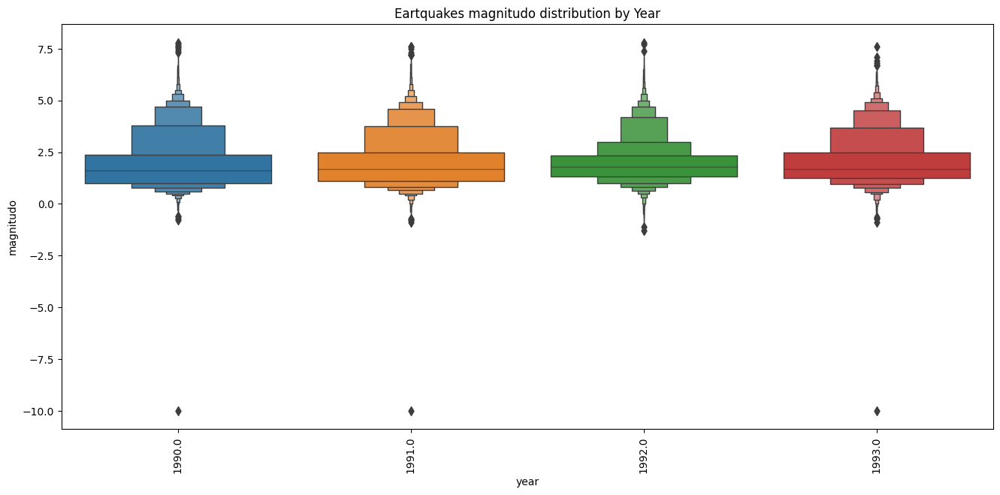

In [19]:
plt.figure(figsize=(16,7))
sns.boxenplot(df,x="year", y="magnitudo",linewidth=1 )
plt.xticks(rotation=90)
plt.title("Eartquakes magnitudo distribution by Year")
plt.show()

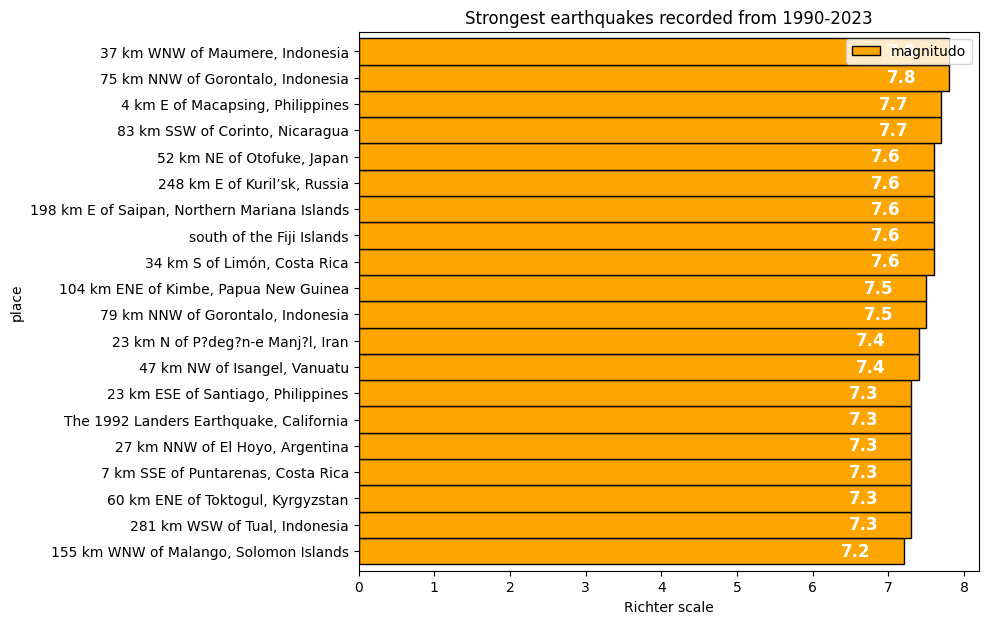

In [20]:
top_mag = df.sort_values(by="magnitudo", ascending = False).head(20)

plot = top_mag.sort_values(by="magnitudo").plot(x="place",y="magnitudo", kind ="barh",width=1, edgecolor="black",figsize =(8,7),color = "orange")
for bars in plot.containers:
        plot.bar_label(bars, padding=-45, fontsize=12, color="white", weight="bold")
plt.title("Strongest earthquakes recorded from 1990-2023")
plt.xlabel("Richter scale")
plt.show()


### Ploting Strongest Earthquakes

In [62]:
def plot_strongest(df):
    gb_top = df.groupby(["state"])\
               .agg({"significance":"max", "magnitudo":"max"})\
               .reset_index()

    b = df[["year", "state","significance","longitude", "latitude","magnitudo"]]
    merge = pd.merge(gb_top, b, how = "left", on =["state","significance", "magnitudo"]).sort_values(by="year")


    fig = px.scatter_geo(merge,
                         lat="latitude", lon="longitude",
                         size="significance",
                         animation_frame="year",
                         projection="natural earth",
                         title = "Strongest eartquake by year")
    fig.show()

plot_strongest(df)

## We generate a report to get a better idea of our data

In [23]:
profile = ProfileReport(df)
profile                     # or this one
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# Filter earthquakes with magnitudo greater than 7
filtered_magnitudo = df[df['magnitudo'] > 7]

### Usually the high impact earthquakes are over a magnitude of 7

In [25]:
# Columns and y-labels for which you want to create plots
columns_to_plot = [
    ('date', 'magnitudo', 'magnitudo by date'),
    ('time', 'magnitudo', 'magnitudo by time'),
    ('state', 'magnitudo', 'magnitudo by state')
]

for column, y_label, title in columns_to_plot:
    data = filtered_magnitudo.groupby(column)[y_label].sum().reset_index()

    # Create a line plot using Plotly Express
    fig = px.line(
        data,
        x=column,
        y=y_label,
        title=title,
        height=800,
        color_discrete_sequence=px.colors.qualitative.Pastel1  # Change the color palette
    )
    fig.update_layout(
        xaxis_title=column,
        yaxis_title=y_label,
        font=dict(size=17, family="Franklin Gothic")
    )

    # Display the plot
    fig.show()

In [26]:
def plot_average_magnitude(data, group_col, x_label, title):
    magnitude_by_group = data.groupby(group_col)['magnitudo'].mean().reset_index()

    fig = px.line(magnitude_by_group, x=group_col, y='magnitudo',
                  title=title,
                  color_discrete_sequence=px.colors.qualitative.Pastel1,  # Change the color palette
                  labels={group_col: x_label, 'magnitudo': 'Average Magnitude'},
                  template='plotly_white')

    fig.show()

# Assuming df is your DataFrame containing earthquake data
# For year
plot_average_magnitude(df, 'year', 'Year', 'Average Magnitude of Earthquakes by Year')

# For month
plot_average_magnitude(df, 'month', 'Month', 'Average Magnitude of Earthquakes by Month')

# For month_name
plot_average_magnitude(df, 'month_name', 'Month Name', 'Average Magnitude of Earthquakes by Month')

# For day_of_month
plot_average_magnitude(df, 'day_of_month', 'Day of Month', 'Average Magnitude of Earthquakes by Day')


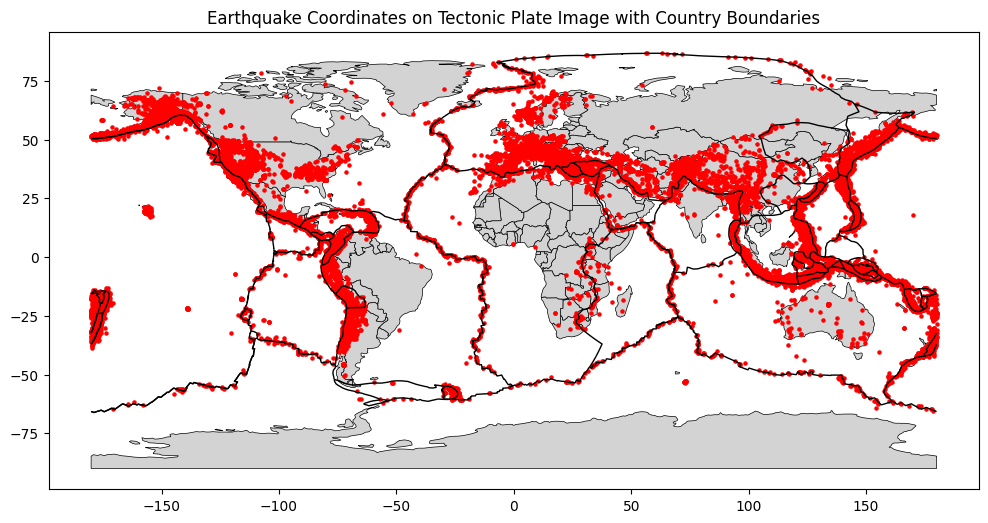

In [27]:
# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(df['longitude'], df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(df, geometry=earthquake_geometry)



# Create a world map with tectonic plate boundaries, countries, and earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Earthquake Coordinates on Tectonic Plate Image with Country Boundaries')
plt.show()

### We plot histograms for magnitude, significance, and depth to get to filter values for them so that we get a more meaningful plot

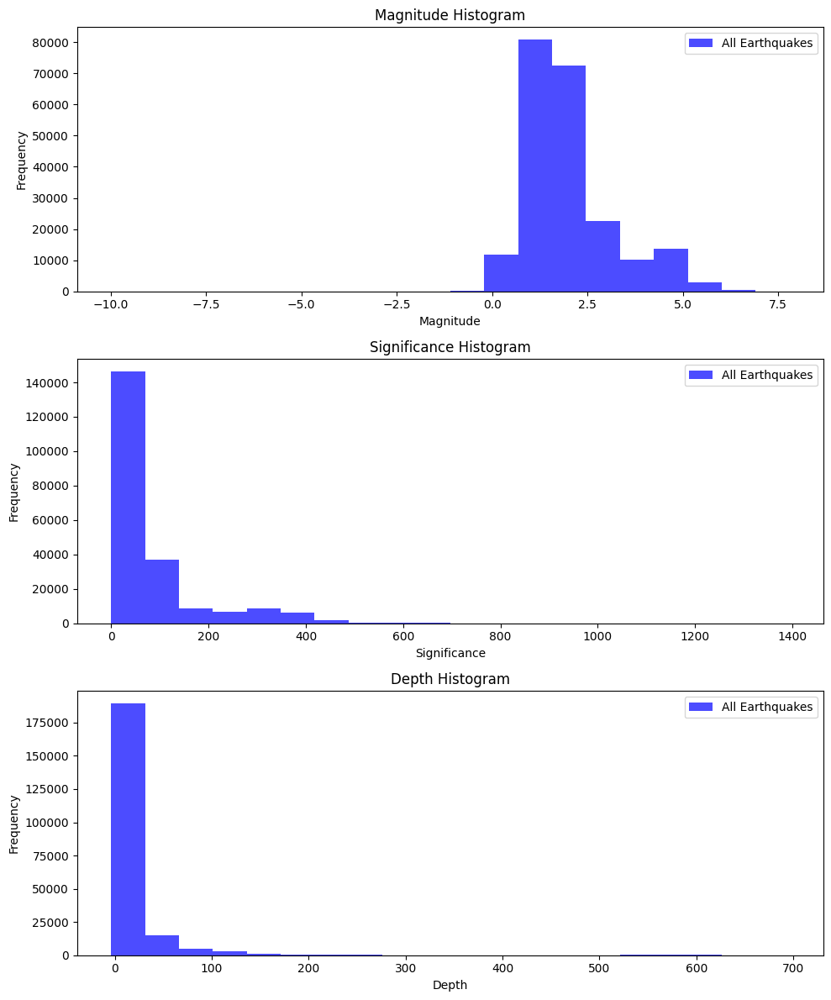

In [28]:
# Create separate histograms for magnitude, significance, and depth
fig, axs = plt.subplots(3, 1, figsize=(10, 12))

# Plot Magnitude Histogram
axs[0].hist(df['magnitudo'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[0].set_title('Magnitude Histogram')
axs[0].set_xlabel('Magnitude')
axs[0].set_ylabel('Frequency')
axs[0].legend()

# Plot Significance Histogram
axs[1].hist(df['significance'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[1].set_title('Significance Histogram')
axs[1].set_xlabel('Significance')
axs[1].set_ylabel('Frequency')
axs[1].legend()

# Plot Depth Histogram
axs[2].hist(df['depth'], bins=20, color='blue', alpha=0.7, label='All Earthquakes')
axs[2].set_title('Depth Histogram')
axs[2].set_xlabel('Depth')
axs[2].set_ylabel('Frequency')
axs[2].legend()

# Adjust layout
plt.tight_layout()
plt.show()

### We try to visualize relationship between magnitude, significance, and depth

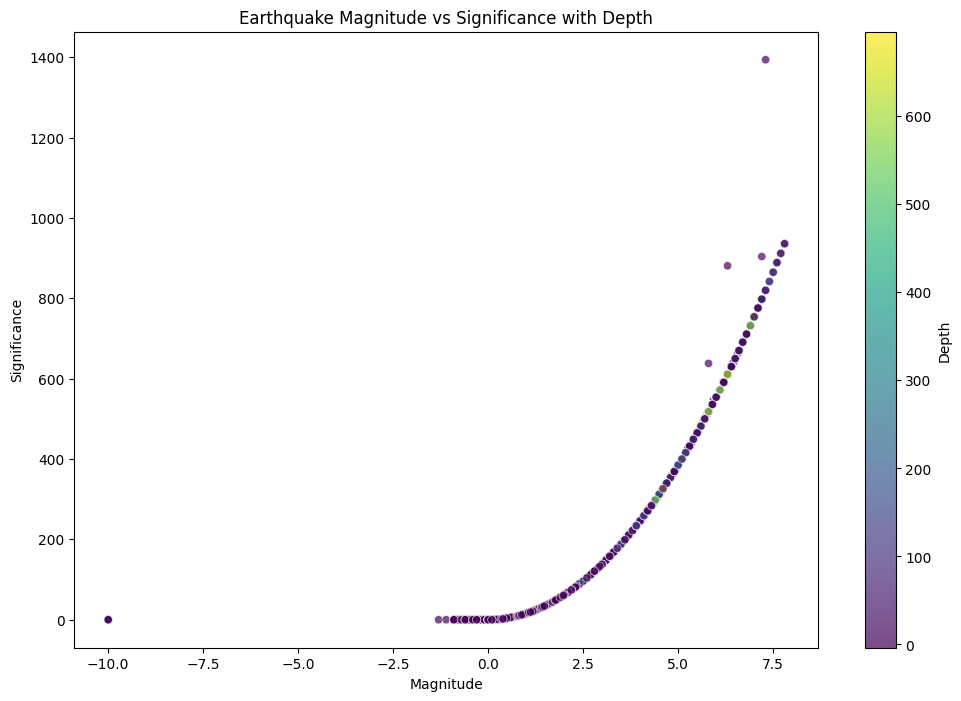

In [29]:
# Filter out NaN values for better plotting
filtered_df = df.dropna(subset=['magnitudo', 'significance', 'depth'])

# Create a scatter plot
plt.figure(figsize=(12, 8))

plt.scatter(filtered_df['magnitudo'], filtered_df['significance'], c=filtered_df['depth'], cmap='viridis', alpha=0.7, edgecolors='w', linewidth=0.5)

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Depth')

# Set labels and title
plt.xlabel('Magnitude')
plt.ylabel('Significance')
plt.title('Earthquake Magnitude vs Significance with Depth')

# Show the plot
plt.show()

### We can conclude  from this graph most earthquakes occur near the boundaries of the tectonic plates

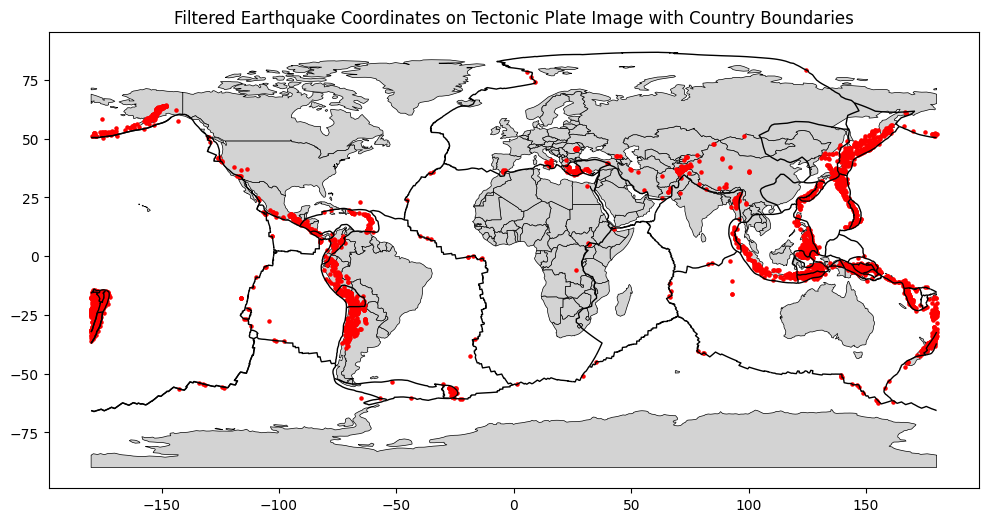

In [30]:
# Filter earthquakes with high magnitudes, significance, and depth
high_magnitude_df = df[df['magnitudo'] > 8]
high_significance_df = df[df['significance'] > 500]
deep_earthquakes_df = df[df['depth'] > 100]

# Combine filtered dataframes
filtered_earthquakes_df = pd.concat([high_magnitude_df, high_significance_df, deep_earthquakes_df], ignore_index=True).drop_duplicates()

# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(filtered_earthquakes_df['longitude'], filtered_earthquakes_df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(filtered_earthquakes_df, geometry=earthquake_geometry)



# Create a world map with tectonic plate boundaries, countries, and filtered earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot filtered earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Filtered Earthquake Coordinates on Tectonic Plate Image with Country Boundaries')
plt.show()

### Usually tsunami occur after earthquakes in deep sea or earthquakes near coastal areas

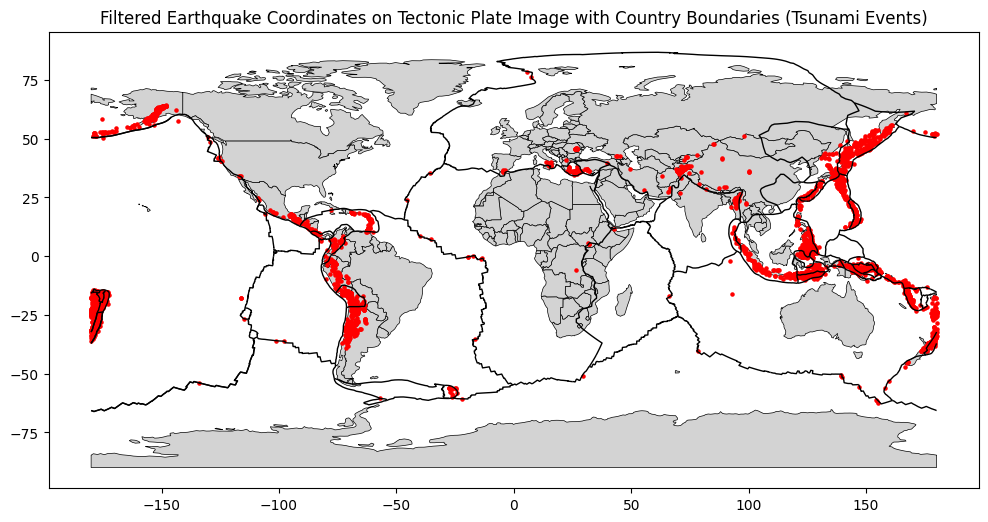

In [31]:
# Filter earthquakes with high magnitudes, significance, depth, and tsunami = 1
high_magnitude_df = df[df['magnitudo'] > 6]
high_significance_df = df[df['significance'] > 2000]
deep_earthquakes_df = df[df['depth'] > 100]
tsunami_df = df[df['tsunami'] == 1]

# Combine filtered dataframes
filtered_earthquakes_df = pd.concat([high_magnitude_df, high_significance_df, deep_earthquakes_df, tsunami_df], ignore_index=True).drop_duplicates()

# Convert the DataFrame to a GeoDataFrame
earthquake_geometry = gpd.points_from_xy(filtered_earthquakes_df['longitude'], filtered_earthquakes_df['latitude'])
earthquake_gdf = gpd.GeoDataFrame(filtered_earthquakes_df, geometry=earthquake_geometry)


# Create a world map with tectonic plate boundaries, countries, and filtered earthquake coordinates
fig, ax = plt.subplots(figsize=(12, 8))

# Plot world countries boundaries
world_countries_gdf.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot tectonic plate boundaries
plate_boundaries_gdf.plot(ax=ax, color='black', linewidth=1)

# Plot filtered earthquake coordinates on top of the map
earthquake_gdf.plot(ax=ax, color='red', markersize=5)

# Set plot title and show the map
plt.title('Filtered Earthquake Coordinates on Tectonic Plate Image with Country Boundaries (Tsunami Events)')
plt.show()

## Preparing Data and getting rid of not usefull data

In [32]:
# Drop rows where 'data_type' is not equal to "earthquake"
df = df[df['data_type'] == 'earthquake']

# Verify the updated DataFrame
print(df.head())

           time                                 place    status  tsunami  \
0  631153353990     12 km NNW of Meadow Lakes, Alaska  Reviewed        0   
1  631153491210            14 km S of Volcano, Hawaii  Reviewed        0   
2  631154083450            7 km W of Cobb, California  Reviewed        0   
3  631155512130  11 km E of Mammoth Lakes, California  Reviewed        0   
4  631155824490                16km N of Fillmore, CA  Reviewed        0   

   significance   data_type  magnitudo        state   longitude   latitude  \
0            96  earthquake       2.50       Alaska -149.669200  61.730200   
1            31  earthquake       1.41       Hawaii -155.212333  19.317667   
2            19  earthquake       1.11   California -122.806167  38.821000   
3            15  earthquake       0.98   California -118.846333  37.664333   
4           134  earthquake       2.95   California -118.934000  34.546000   

    depth                             date  hour  day_of_month weekday  mo

In [33]:
df['data_type'].value_counts()


data_type
earthquake    209488
Name: count, dtype: int64

In [34]:
df.columns

Index(['time', 'place', 'status', 'tsunami', 'significance', 'data_type',
       'magnitudo', 'state', 'longitude', 'latitude', 'depth', 'date', 'hour',
       'day_of_month', 'weekday', 'month', 'month_name', 'year',
       'data_type_group'],
      dtype='object')

In [35]:
columns_to_drop = ['data_type', 'data_type_group', 'place',]

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)



<ipython-input-35-bf332d78f595>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [36]:
df.head()

,time,status,tsunami,significance,magnitudo,state,longitude,latitude,depth,date,hour,day_of_month,weekday,month,month_name,year
0,631153353990,Reviewed,0,96,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00,0.0,1.0,Monday,1.0,January,1990.0
1,631153491210,Reviewed,0,31,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00,0.0,1.0,Monday,1.0,January,1990.0
2,631154083450,Reviewed,0,19,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00,0.0,1.0,Monday,1.0,January,1990.0
3,631155512130,Reviewed,0,15,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00,0.0,1.0,Monday,1.0,January,1990.0
4,631155824490,Reviewed,0,134,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00,1.0,1.0,Monday,1.0,January,1990.0


In [37]:
# Select columns with object (categorical) data types
num_cols = df.select_dtypes(include='object').columns.tolist()

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to the selected numerical columns
for x in num_cols:
    df[x] = le.fit_transform(df[x])

# Now, your categorical columns (excluding column 0) have been converted to numerical values
df.head()

<ipython-input-37-8ad099a057a0>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-37-8ad099a057a0>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-37-8ad099a057a0>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-37-8ad099a

,time,status,tsunami,significance,magnitudo,state,longitude,latitude,depth,date,hour,day_of_month,weekday,month,month_name,year
0,631153353990,1,0,96,2.50,3,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00,0.0,1.0,1,1.0,4,1990.0
1,631153491210,1,0,31,1.41,75,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00,0.0,1.0,1,1.0,4,1990.0
2,631154083450,1,0,19,1.11,33,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00,0.0,1.0,1,1.0,4,1990.0
3,631155512130,1,0,15,0.98,33,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00,0.0,1.0,1,1.0,4,1990.0
4,631155824490,1,0,134,2.95,263,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00,1.0,1.0,1,1.0,4,1990.0


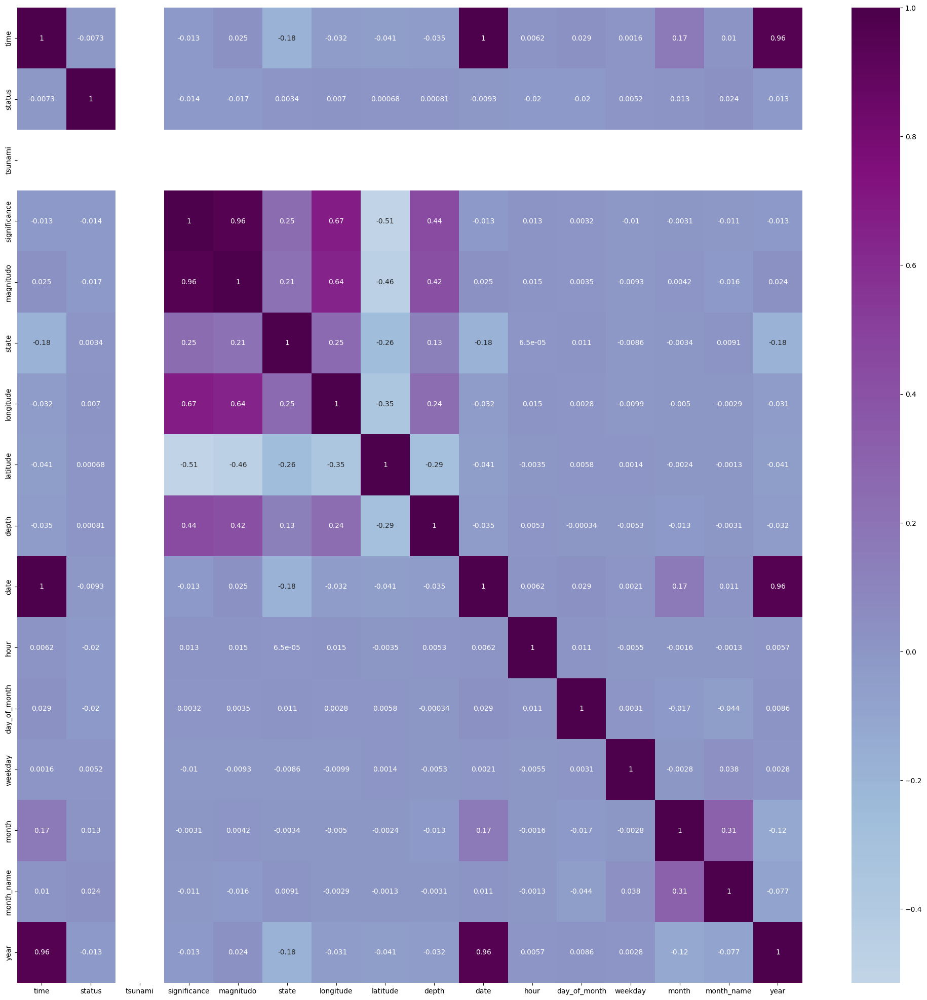

In [38]:
Corr_Matrix = df.corr()

# Set up the figure and plot the heatmap
plt.figure(figsize=(25,25))
sns.heatmap(Corr_Matrix, annot=True, cmap='BuPu', center=0)
plt.show()

In [39]:
print('Top 5 Most Positively Correlated to the To magnitudo')
Corr_Matrix['magnitudo'].sort_values(ascending=False).head(5)

Top 5 Most Positively Correlated to the To magnitudo


magnitudo       1.000000
significance    0.962742
longitude       0.639187
depth           0.416394
state           0.213101
Name: magnitudo, dtype: float64

In [40]:
print('Top 5 Most Negatively Correlated to magnitudo ')
Corr_Matrix['magnitudo'].sort_values(ascending=True).head(5)

Top 5 Most Negatively Correlated to magnitudo 


latitude       -0.464246
status         -0.017070
month_name     -0.016157
weekday        -0.009343
day_of_month    0.003543
Name: magnitudo, dtype: float64

In [41]:
df.dtypes

time                          int64
status                        int64
tsunami                       int64
significance                  int64
magnitudo                   float64
state                         int64
longitude                   float64
latitude                    float64
depth                       float64
date            datetime64[ns, UTC]
hour                        float64
day_of_month                float64
weekday                       int64
month                       float64
month_name                    int64
year                        float64
dtype: object

In [42]:
columns_to_drop = ['date','time']

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)

# Verify the updated DataFrame
print(df.head())

   status  tsunami  significance  magnitudo  state   longitude   latitude  \
0       1        0            96       2.50      3 -149.669200  61.730200   
1       1        0            31       1.41     75 -155.212333  19.317667   
2       1        0            19       1.11     33 -122.806167  38.821000   
3       1        0            15       0.98     33 -118.846333  37.664333   
4       1        0           134       2.95    263 -118.934000  34.546000   

    depth  hour  day_of_month  weekday  month  month_name    year  
0  30.100   0.0           1.0        1    1.0           4  1990.0  
1   6.585   0.0           1.0        1    1.0           4  1990.0  
2   3.220   0.0           1.0        1    1.0           4  1990.0  
3  -0.584   0.0           1.0        1    1.0           4  1990.0  
4  16.122   1.0           1.0        1    1.0           4  1990.0  


<ipython-input-42-a43c7534e648>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Modeling - We are only using 40% of the data as there are over 3 million rows and it takes a lot of time for the algos to run

##We used 40% of our dataset for training and testing the following models:

[1]Linear Regression</br>
[2]Ridge Regression</br>
[3]XGBoost Regressor</br>
[4]Decision Tree</br>
[5]Random Forest</br>

In [43]:
# Set the percentage of data you want to sample
sample_percentage = 0.4  # for example, 40%

# Perform random sampling
sampled_df = df.sample(frac=sample_percentage, random_state=42)

# Split the sampled data into features (X) and target variable (y)
X = sampled_df.drop('magnitudo', axis=1)  # Replace 'target_column' with your actual target variable
y = sampled_df['magnitudo']

# Split the data into training and testing sets
X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled = train_test_split(X, y, test_size=0.2, random_state=42)

### We use Linear regression because it can process large amount of data faster and we use ridge regression incase our Linear regression model overfits.

In [46]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer

# Create an imputer object with a median filling strategy
imputer = SimpleImputer(strategy='median')
X_train_sampled = imputer.fit_transform(X_train_sampled)
X_test_sampled = imputer.transform(X_test_sampled)

# Create a pipeline with scaling and linear regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Normalizes the data
    ('lin_reg', LinearRegression())
])

# Define the parameter grid to search
param_grid = {
    'lin_reg__fit_intercept': [True, False],
    'lin_reg__positive': [True, False]  # Enforces positive coefficients, if necessary
}

# Create the GridSearchCV object
linear_grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit the model
linear_grid_search.fit(X_train_sampled, y_train_sampled)
best_linear_model = linear_grid_search.best_estimator_

# Make predictions
y_pred_linear = best_linear_model.predict(X_test_sampled)

# Evaluate the model
mse_linear = mean_squared_error(y_test_sampled, y_pred_linear)
mae_linear = mean_absolute_error(y_test_sampled, y_pred_linear)
r2_linear = r2_score(y_test_sampled, y_pred_linear)

print(f"Linear Regression MSE on Test Set: {mse_linear}")
print(f"Linear Regression MAE on Test Set: {mae_linear}")
print(f"Linear Regression R-squared on Test Set: {r2_linear}")



Linear Regression MSE on Test Set: 0.08886258443454353
Linear Regression MAE on Test Set: 0.23482988926272988
Linear Regression R-squared on Test Set: 0.9329817730145656


In [47]:
# Ridge Regression
ridge_reg = Ridge()
ridge_param_grid = {'alpha': [0.1, 1, 10]}

ridge_grid_search = GridSearchCV(estimator=ridge_reg, param_grid=ridge_param_grid,
                                 scoring='neg_mean_squared_error', cv=5)
ridge_grid_search.fit(X_train_sampled, y_train_sampled)

best_ridge_model = ridge_grid_search.best_estimator_

# Ensure the Ridge Regression model is fitted before making predictions
best_ridge_model.fit(X_train_sampled, y_train_sampled)
y_pred_ridge = best_ridge_model.predict(X_test_sampled)

# Evaluate the best Ridge Regression model on the test set
mse_ridge = mean_squared_error(y_test_sampled, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test_sampled, y_pred_ridge)
r2_ridge = r2_score(y_test_sampled, y_pred_ridge)

print(f"Ridge Regression MSE on Test Set: {mse_ridge}")
print(f"Ridge Regression MAE on Test Set: {mae_ridge}")
print(f"Ridge Regression R-squared on Test Set: {r2_ridge}")


Ridge Regression MSE on Test Set: 0.08886220427568252
Ridge Regression MAE on Test Set: 0.23482948417837135
Ridge Regression R-squared on Test Set: 0.932982059722104


In [48]:
# XGBoost Regressor
xgb_reg = xgb.XGBRegressor()
xgb_param_grid = {'learning_rate': [0.01, 0.1, 0.2],
                  'max_depth': [3, 4, 5],
                  'n_estimators': [100, 200, 300]}

xgb_grid_search = GridSearchCV(estimator=xgb_reg, param_grid=xgb_param_grid,
                                scoring='neg_mean_squared_error', cv=5)
xgb_grid_search.fit(X_train_sampled, y_train_sampled)

best_xgb_model = xgb_grid_search.best_estimator_

# Ensure the XGBoost model is fitted before making predictions
best_xgb_model.fit(X_train_sampled, y_train_sampled)
y_pred_xgb = best_xgb_model.predict(X_test_sampled)

# Evaluate the best XGBoost model on the test set
mse_xgb = mean_squared_error(y_test_sampled, y_pred_xgb)
mae_xgb = mean_absolute_error(y_test_sampled, y_pred_xgb)
r2_xgb = r2_score(y_test_sampled, y_pred_xgb)

print(f"XGBoost Regressor MSE on Test Set: {mse_xgb}")
print(f"XGBoost Regressor MAE on Test Set: {mae_xgb}")
print(f"XGBoost Regressor R-squared on Test Set: {r2_xgb}")

XGBoost Regressor MSE on Test Set: 0.0010158606325959116
XGBoost Regressor MAE on Test Set: 0.01023963580173979
XGBoost Regressor R-squared on Test Set: 0.9992338600222569


### Here we predict values for every 1000 iterations to get any idea of how our model is performing

In [49]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_linear), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 1.72  |  Predicted Magnitude: 1.56
Iteration: 2000  |  Actual Magnitude: 2.11  |  Predicted Magnitude: 1.88
Iteration: 3000  |  Actual Magnitude: 2.20  |  Predicted Magnitude: 1.81
Iteration: 4000  |  Actual Magnitude: 1.73  |  Predicted Magnitude: 1.62
Iteration: 5000  |  Actual Magnitude: 3.30  |  Predicted Magnitude: 3.04
Iteration: 6000  |  Actual Magnitude: 3.47  |  Predicted Magnitude: 3.22
Iteration: 7000  |  Actual Magnitude: 0.90  |  Predicted Magnitude: 1.21
Iteration: 8000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 5.03
Iteration: 9000  |  Actual Magnitude: 0.61  |  Predicted Magnitude: 1.04
Iteration: 10000  |  Actual Magnitude: 0.85  |  Predicted Magnitude: 1.16
Iteration: 11000  |  Actual Magnitude: 2.31  |  Predicted Magnitude: 2.08
Iteration: 12000  |  Actual Magnitude: 3.40  |  Predicted Magnitude: 3.07
Iteration: 13000  |  Actual Magnitude: 2.70  |  Predicted Magnitude: 2.33
Iteration: 14000  |  Actual Magnitude: 0.50  | 

In [50]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_ridge), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 1.72  |  Predicted Magnitude: 1.56
Iteration: 2000  |  Actual Magnitude: 2.11  |  Predicted Magnitude: 1.88
Iteration: 3000  |  Actual Magnitude: 2.20  |  Predicted Magnitude: 1.81
Iteration: 4000  |  Actual Magnitude: 1.73  |  Predicted Magnitude: 1.62
Iteration: 5000  |  Actual Magnitude: 3.30  |  Predicted Magnitude: 3.04
Iteration: 6000  |  Actual Magnitude: 3.47  |  Predicted Magnitude: 3.22
Iteration: 7000  |  Actual Magnitude: 0.90  |  Predicted Magnitude: 1.21
Iteration: 8000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 5.03
Iteration: 9000  |  Actual Magnitude: 0.61  |  Predicted Magnitude: 1.04
Iteration: 10000  |  Actual Magnitude: 0.85  |  Predicted Magnitude: 1.16
Iteration: 11000  |  Actual Magnitude: 2.31  |  Predicted Magnitude: 2.08
Iteration: 12000  |  Actual Magnitude: 3.40  |  Predicted Magnitude: 3.07
Iteration: 13000  |  Actual Magnitude: 2.70  |  Predicted Magnitude: 2.33
Iteration: 14000  |  Actual Magnitude: 0.50  | 

In [51]:
for i, (actual, predicted) in enumerate(zip(y_test_sampled, y_pred_xgb), 1):
    if i % 1000 == 0:
        print(f"Iteration: {i}  |  Actual Magnitude: {actual:.2f}  |  Predicted Magnitude: {predicted:.2f}")

Iteration: 1000  |  Actual Magnitude: 1.72  |  Predicted Magnitude: 1.72
Iteration: 2000  |  Actual Magnitude: 2.11  |  Predicted Magnitude: 2.11
Iteration: 3000  |  Actual Magnitude: 2.20  |  Predicted Magnitude: 2.20
Iteration: 4000  |  Actual Magnitude: 1.73  |  Predicted Magnitude: 1.72
Iteration: 5000  |  Actual Magnitude: 3.30  |  Predicted Magnitude: 3.31
Iteration: 6000  |  Actual Magnitude: 3.47  |  Predicted Magnitude: 3.41
Iteration: 7000  |  Actual Magnitude: 0.90  |  Predicted Magnitude: 0.89
Iteration: 8000  |  Actual Magnitude: 4.80  |  Predicted Magnitude: 4.80
Iteration: 9000  |  Actual Magnitude: 0.61  |  Predicted Magnitude: 0.62
Iteration: 10000  |  Actual Magnitude: 0.85  |  Predicted Magnitude: 0.85
Iteration: 11000  |  Actual Magnitude: 2.31  |  Predicted Magnitude: 2.30
Iteration: 12000  |  Actual Magnitude: 3.40  |  Predicted Magnitude: 3.40
Iteration: 13000  |  Actual Magnitude: 2.70  |  Predicted Magnitude: 2.71
Iteration: 14000  |  Actual Magnitude: 0.50  | 

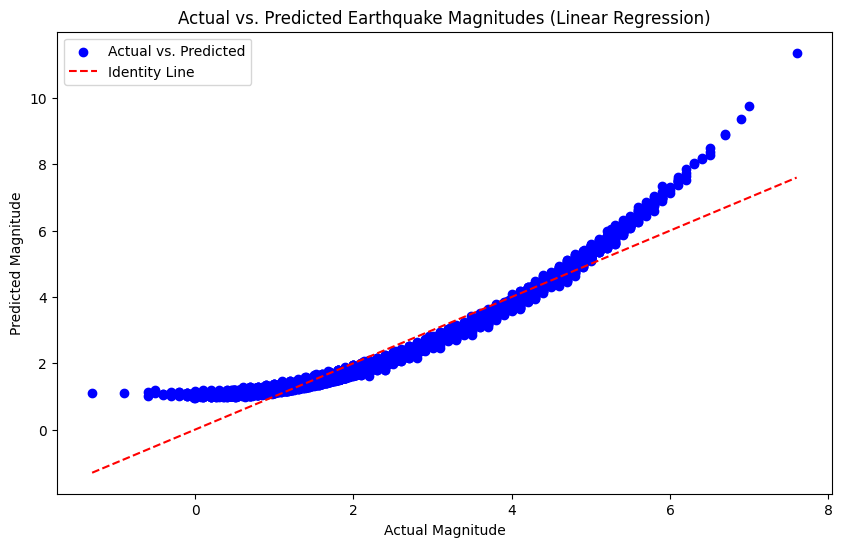

In [52]:

# Sort the values for plotting
y_test_sorted, y_pred_linear_sorted = zip(*sorted(zip(y_test_sampled, y_pred_linear)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_linear_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (Linear Regression)")
plt.legend()
plt.show()

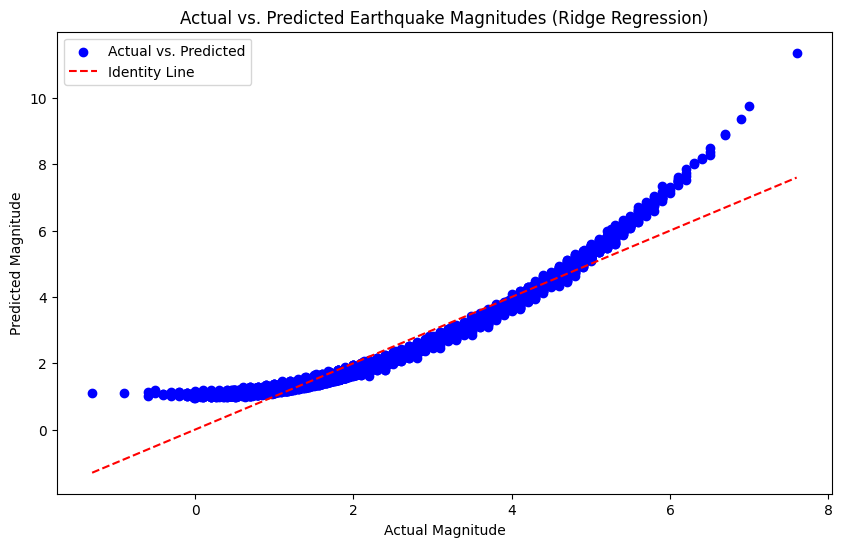

In [53]:

# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_ridge)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (Ridge Regression)")
plt.legend()
plt.show()


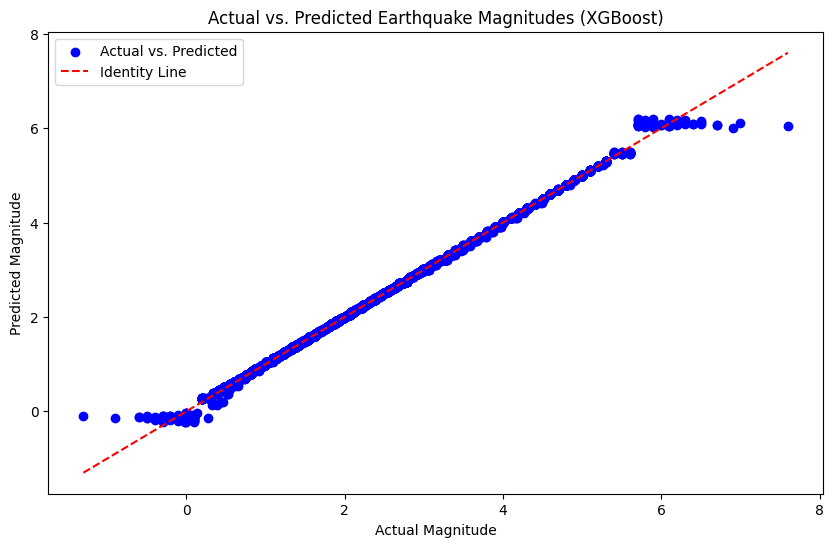

In [54]:
# Sort the values for plotting
y_test_sorted, y_pred_xgb_sorted = zip(*sorted(zip(y_test_sampled, y_pred_xgb)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_xgb_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (XGBoost)")
plt.legend()
plt.show()

In [59]:

# Define the DecisionTreeRegressor with default parameters
dt_regressor = DecisionTreeRegressor()

# Train the Decision Tree model on the training set
dt_regressor.fit(X_train_sampled, y_train_sampled)

# Make predictions on the test set
y_pred_dt = dt_regressor.predict(X_test_sampled)

# Evaluate the Decision Tree model
mse_dt = mean_squared_error(y_test_sampled, y_pred_dt)
mae_dt = mean_absolute_error(y_test_sampled, y_pred_dt)
r2_dt = r2_score(y_test_sampled, y_pred_dt)

print("Mean Squared Error on Test Set (Decision Tree):", mse_dt)
print("Mean Absolute Error on Test Set (Decision Tree):", mae_dt)
print("R-squared on Test Set (Decision Tree):", r2_dt)


Mean Squared Error on Test Set (Decision Tree): 0.0005894981800823442
Mean Absolute Error on Test Set (Decision Tree): 0.0056805298645531115
R-squared on Test Set (Decision Tree): 0.9995554133036795


In [60]:

# Define the RandomForestRegressor with default parameters
rf_regressor = RandomForestRegressor()

# Train the Random Forest model on the training set
rf_regressor.fit(X_train_sampled, y_train_sampled)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test_sampled)

# Evaluate the Random Forest model
mse_rf = mean_squared_error(y_test_sampled, y_pred_rf)
mae_rf = mean_absolute_error(y_test_sampled, y_pred_rf)
r2_rf = r2_score(y_test_sampled, y_pred_rf)

print("Mean Squared Error on Test Set (Random Forest):", mse_rf)
print("Mean Absolute Error on Test Set (Random Forest):", mae_rf)
print("R-squared on Test Set (Random Forest):", r2_rf)


Mean Squared Error on Test Set (Random Forest): 0.00035707002148099566
Mean Absolute Error on Test Set (Random Forest): 0.004961865266425461
R-squared on Test Set (Random Forest): 0.9997307055618336


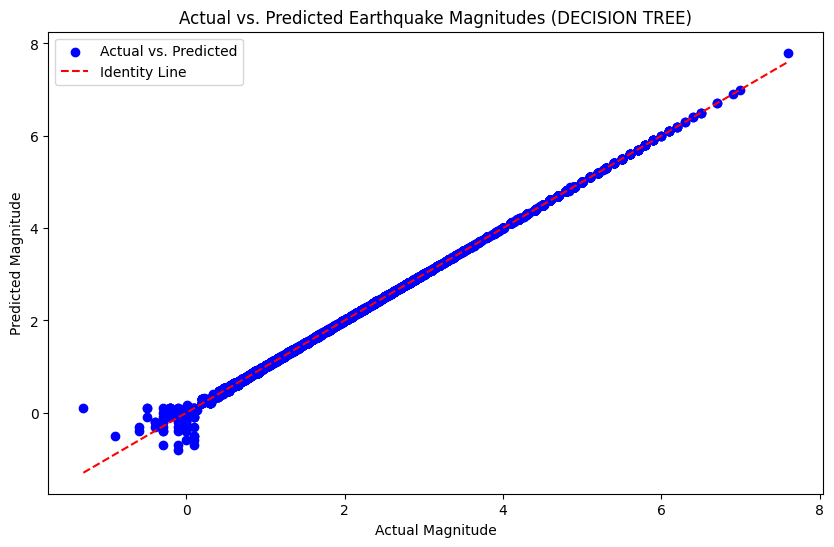

In [57]:
# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_dt)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (DECISION TREE)")
plt.legend()
plt.show()

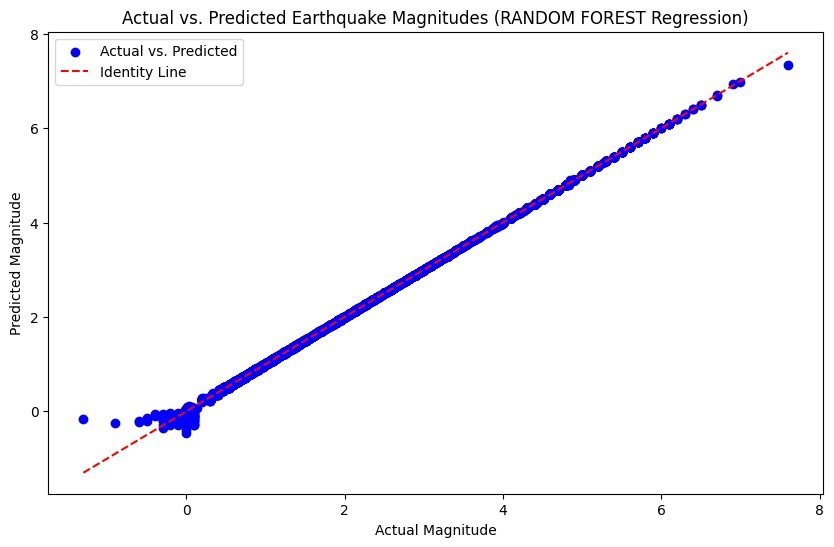

In [58]:
# Sort the values for plotting
y_test_sorted, y_pred_ridge_sorted = zip(*sorted(zip(y_test_sampled, y_pred_rf)))

plt.figure(figsize=(10, 6))
plt.scatter(y_test_sorted, y_pred_ridge_sorted, color='blue', label='Actual vs. Predicted')

# Add the identity line (y=x)
plt.plot(np.linspace(min(y_test_sampled), max(y_test_sampled), 100), np.linspace(min(y_test_sampled), max(y_test_sampled), 100), color='red', linestyle='--', label='Identity Line')

plt.xlabel("Actual Magnitude")
plt.ylabel("Predicted Magnitude")
plt.title("Actual vs. Predicted Earthquake Magnitudes (RANDOM FOREST Regression)")
plt.legend()
plt.show()

# References

[1] https://www.kaggle.com/datasets/alessandrolobello/the-ultimate-earthquake-dataset-from-1990-2023/data

[2] https://github.com/fraxen/tectonicplates

[3]https://www.naturalearthdata.com/downloads/110m-cultural-vectors/

[4]https://ydata.ai/?utm_source=opensource&utm_medium=pandasprofiling&utm_campaign=report

#License

##MIT License

Copyright (c) 2024 baiganas

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

